In [1]:
#%matplotlib inline
import config.unetConfig as cfg
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os
import random

import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data import BraTSDataset
from gan.GANTrainer import GANTrainer
from gan.UNetGenerator import UNetGenerator
from gan.UNetDiscriminator import UNetDiscriminator
from IPython.display import HTML
from torch.utils.data import DataLoader
from utils import weights_init_norm, weights_init_ortho, plot_train_metrics

!jupyter nbextension enable --py widgetsnbextension

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
Random Seed:  999


## Load the data

#### TODO: Need to do for other classes as well

In [2]:
# load the T1 image filepaths in a sorted manner
image_paths = [os.path.join(cfg.T1_DATASET_PATH, impath) for impath in sorted(os.listdir(cfg.T1_DATASET_PATH))]

tf = transforms.Compose([
    transforms.Resize((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.CenterCrop((cfg.INPUT_IMAGE_HEIGHT,cfg.INPUT_IMAGE_WIDTH)),
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
    ])

# Create the dataset
dataset = BraTSDataset(image_paths, tf)

# Create the dataloader
dataloader = DataLoader(dataset, batch_size=cfg.BATCH_SIZE,
                        shuffle=True, num_workers=cfg.NUM_WORKERS)

# # Plot some training images
# real_batch = next(iter(dataloader))
# plt.figure(figsize=(15,15))
# plt.axis("off")
# plt.title("Training Images (T1)")
# plt.imshow(np.transpose(vutils.make_grid(real_batch.to(cfg.DEVICE), scale_each=True, normalize=True).cpu(),(1,2,0)))

## Init Generator and weights

In [3]:
# Create the generator
netG = UNetGenerator(cfg.LATENT_SZ, cfg.NGF, cfg.NGC).to(cfg.DEVICE)

# Apply the weights_init_ortho
netG.apply(weights_init_norm)

# Print the model
print(netG)

UNetGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01, inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01, inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01, inplace=True)
    (1

## Init Discriminator and weights

In [4]:
# Create the Discriminator
netD = UNetDiscriminator().to(cfg.DEVICE)

# Apply the weights_init_ortho
netD.apply(weights_init_ortho)

# Print the model
print(netD)

/home/y2k/csc2529-2022-project/src/utils.py:18: UserWarning: nn.init.orthogonal is now deprecated in favor of nn.init.orthogonal_.
  nn.init.orthogonal(m.weight.data)


UNetDiscriminator(
  (encoder): Encoder(
    (enc_blocks): ModuleList(
      (0): Block(
        (main): Sequential(
          (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (1): Block(
        (main): Sequential(
          (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
      (2): Block(
        (main): Sequential(
          (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), bias=False)
        )
      )
    )
    (downsample): AvgPool2d(kernel_size=2, stride=2, padding=0)
  )
  (decoder): Decoder(
   

## Train

In [7]:
trainer.train(cfg.LATENT_SZ)

Starting Training Loop...
[0/20][0/6]	Loss_D: 77.3335	Loss_G: 0.5033	D(x): 0.0286	D(G(z)): 0.5110 / 0.6047
[0/20][2/6]	Loss_D: 1.6064	Loss_G: 0.3292	D(x): 1.0000	D(G(z)): 0.7988 / 0.7196
[0/20][4/6]	Loss_D: 1.6408	Loss_G: 0.3347	D(x): 1.0000	D(G(z)): 0.8055 / 0.7157
[1/20][0/6]	Loss_D: 1.5073	Loss_G: 0.3794	D(x): 1.0000	D(G(z)): 0.7776 / 0.6845
[1/20][2/6]	Loss_D: 1.2962	Loss_G: 0.4700	D(x): 1.0000	D(G(z)): 0.7259 / 0.6252
[1/20][4/6]	Loss_D: 1.1045	Loss_G: 0.6011	D(x): 1.0000	D(G(z)): 0.6684 / 0.5484
[2/20][0/6]	Loss_D: 0.9841	Loss_G: 0.6725	D(x): 1.0000	D(G(z)): 0.6260 / 0.5107
[2/20][2/6]	Loss_D: 4.1601	Loss_G: 0.1530	D(x): 0.9528	D(G(z)): 0.4991 / 0.8585
[2/20][4/6]	Loss_D: 2.2235	Loss_G: 0.1578	D(x): 1.0000	D(G(z)): 0.8902 / 0.8543
[3/20][0/6]	Loss_D: 1.9778	Loss_G: 0.1984	D(x): 1.0000	D(G(z)): 0.8604 / 0.8203
[3/20][2/6]	Loss_D: 1.7561	Loss_G: 0.2454	D(x): 1.0000	D(G(z)): 0.8263 / 0.7826
[3/20][4/6]	Loss_D: 1.5575	Loss_G: 0.2986	D(x): 1.0000	D(G(z)): 0.7877 / 0.7423
[4/20][0/6]	L

## Plot Training Results

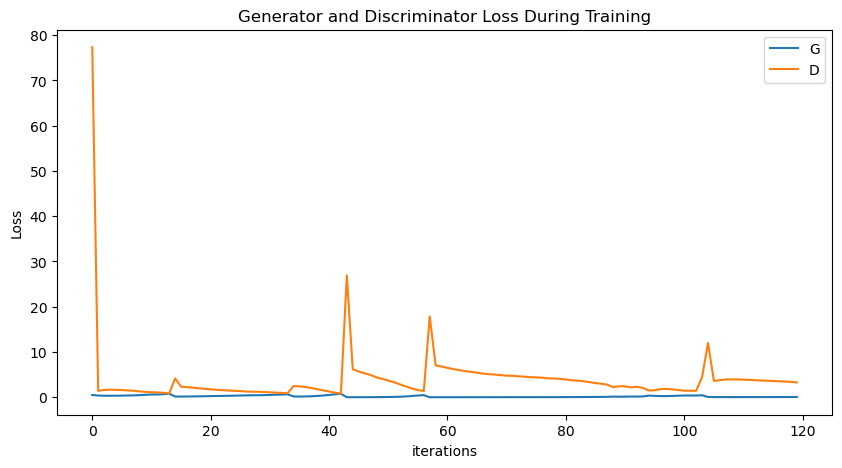

In [10]:
plot_train_metrics(trainer.G_losses, trainer.D_losses)

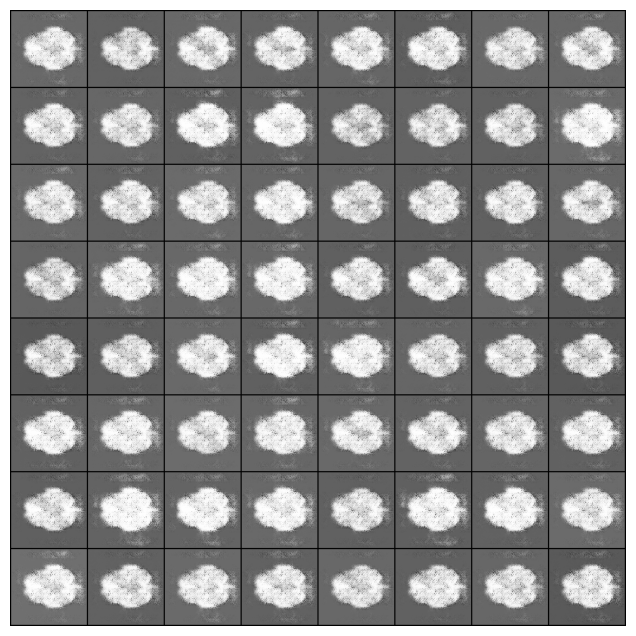

In [9]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in trainer.img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())